# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

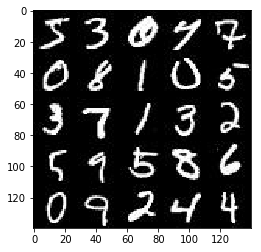

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

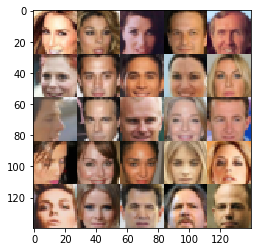

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    source = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels))
    z = tf.placeholder(tf.float32, (None, z_dim))
    learning_rate = tf.placeholder(tf.float32)

    return source, z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "C:\\Users\\lslea\\AppData\\Local\\conda\\conda\\envs\\dlnd-tf-lab\\lib\\runpy.py", line 184, in _run_module_as_main\n    "__main__", mod_spec)', 'File "C:\\Users\\lslea\\AppData\\Local\\conda\\conda\\envs\\dlnd-tf-lab\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "C:\\Users\\lslea\\AppData\\Local\\conda\\conda\\envs\\dlnd-tf-lab\\lib\\site-packages\\ipykernel\\__main__.py", line 3, in <module>\n    app.launch_new_instance()', 'File "C:\\Users\\lslea\\AppData\\Local\\conda\\conda\\envs\\dlnd-tf-lab\\lib\\site-packages\\traitlets\\config\\application.py", line 658, in launch_instance\n    app.start()', 'File "C:\\Users\\lslea\\AppData\\Local\\conda\\conda\\envs\\dlnd-tf-

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [66]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    leaky_alpha = 0.1
    with tf.variable_scope('discriminator', reuse=reuse):
        # 28x28x3
        x = tf.layers.conv2d(images, 64, 4, 2,'same')
        x = tf.maximum(leaky_alpha * x, x)
        # 14x14
        
        x = tf.layers.conv2d(x, 128, 4, 2, 'same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(leaky_alpha * x, x)
        # 7*7
        
        x = tf.layers.conv2d(x, 256, 4, 2, 'same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(leaky_alpha * x, x)
        # 4*4

        x = tf.reshape(x, (-1, 4*4*256))
        logits = tf.layers.dense(x, 1)
        output = tf.sigmoid(logits)
        return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [67]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    leaky_alpha = 0.1
    with tf.variable_scope('generator', reuse=not is_train):
        x = tf.layers.dense(z, 4*4*256)
        
        x = tf.reshape(x, (-1,4,4,256))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(leaky_alpha * x, x)
        # 4x4x256
        x = tf.layers.conv2d_transpose(x, 128, 4, 1, 'valid')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(leaky_alpha * x, x)
        # 7x7x128
        x = tf.layers.conv2d_transpose(x, 64, 4, 2, 'same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(leaky_alpha * x, x)
        # 14x14x64
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, 4, 2, 'same')
        # 28 x 28 x out_channel_dim        
        out = tf.tanh(logits)
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [68]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    smooth = 0.1
    # TODO: Implement Function
    input_fake = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(input_fake, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    return d_loss_real + d_loss_fake, g_loss
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [69]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    t_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    d_ops = [var for var in t_ops if var.name.startswith('discriminator')]
    g_ops = [var for var in t_ops if var.name.startswith('generator')]
    
    with tf.control_dependencies(d_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_ops):  
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [70]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [71]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    inputs_real, inputs_z, lr = model_inputs(data_shape[1],data_shape[2],data_shape[3], z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[-1])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                sess.run(d_train_opt, feed_dict= {inputs_real: batch_images, inputs_z: batch_z, lr:learning_rate})
                sess.run(g_train_opt, feed_dict= {inputs_z: batch_z, lr:learning_rate})
                if steps % 100 == 0:
                    train_loss_d = d_loss.eval({inputs_real: batch_images, inputs_z: batch_z})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})
                    losses.append((train_loss_d, train_loss_g))
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, steps),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))  
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 Step 100... Discriminator Loss: 0.3932... Generator Loss: 3.3778


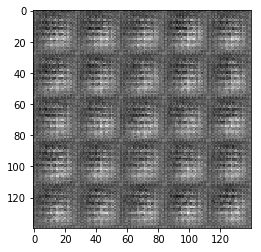

Epoch 1/2 Step 200... Discriminator Loss: 0.4991... Generator Loss: 2.2953


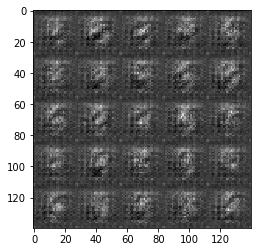

Epoch 1/2 Step 300... Discriminator Loss: 0.6256... Generator Loss: 3.4364


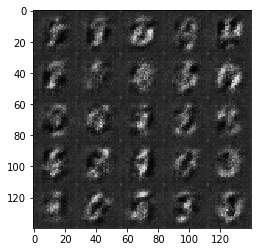

Epoch 1/2 Step 400... Discriminator Loss: 0.5674... Generator Loss: 1.7651


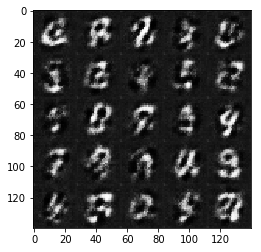

Epoch 2/2 Step 500... Discriminator Loss: 0.5186... Generator Loss: 2.1519


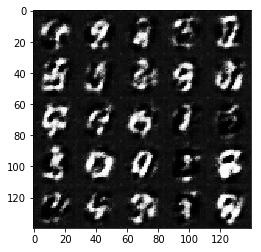

Epoch 2/2 Step 600... Discriminator Loss: 0.5242... Generator Loss: 1.9814


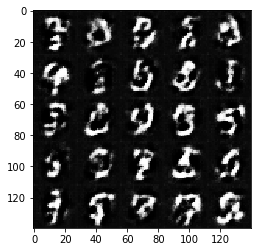

Epoch 2/2 Step 700... Discriminator Loss: 0.7533... Generator Loss: 1.2160


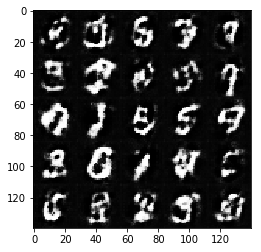

Epoch 2/2 Step 800... Discriminator Loss: 0.7873... Generator Loss: 1.2027


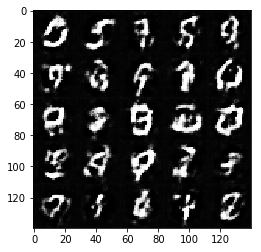

Epoch 2/2 Step 900... Discriminator Loss: 0.8989... Generator Loss: 1.0791


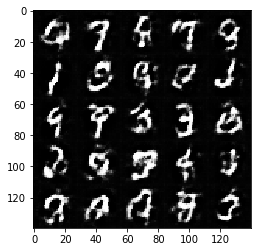

In [72]:
batch_size = 128
z_dim = 128
learning_rate = 0.0001
beta1 = 0.2
losses = []

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

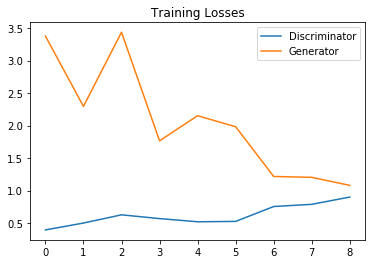

In [73]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10 Step 100... Discriminator Loss: 1.2682... Generator Loss: 0.9869


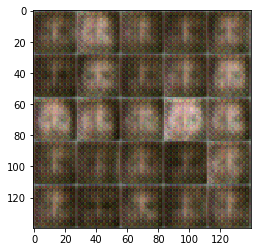

Epoch 1/10 Step 200... Discriminator Loss: 1.2968... Generator Loss: 0.9417


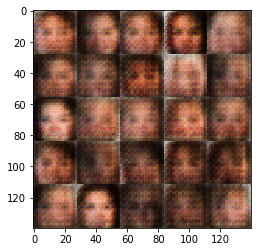

Epoch 1/10 Step 300... Discriminator Loss: 1.5108... Generator Loss: 0.4527


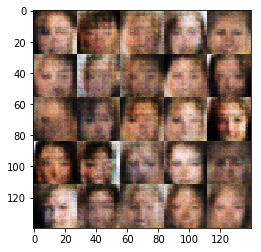

Epoch 1/10 Step 400... Discriminator Loss: 1.3663... Generator Loss: 1.2310


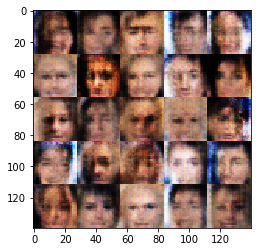

Epoch 1/10 Step 500... Discriminator Loss: 1.2698... Generator Loss: 0.6470


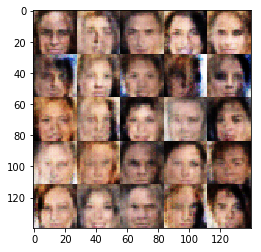

Epoch 1/10 Step 600... Discriminator Loss: 1.3538... Generator Loss: 1.3172


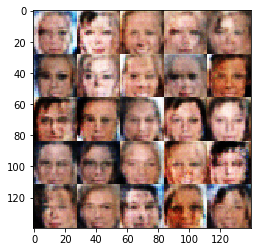

Epoch 1/10 Step 700... Discriminator Loss: 1.3627... Generator Loss: 0.5352


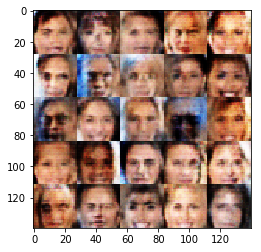

Epoch 1/10 Step 800... Discriminator Loss: 1.1752... Generator Loss: 0.8513


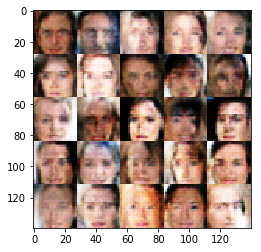

Epoch 1/10 Step 900... Discriminator Loss: 1.1399... Generator Loss: 0.9672


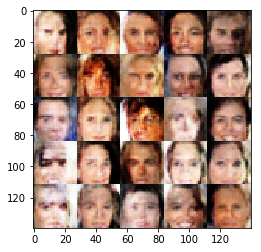

Epoch 1/10 Step 1000... Discriminator Loss: 1.2553... Generator Loss: 0.6876


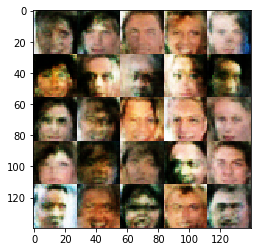

Epoch 1/10 Step 1100... Discriminator Loss: 1.3449... Generator Loss: 1.3546


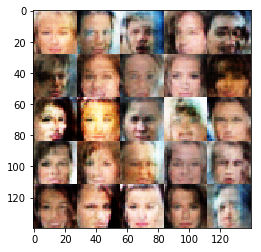

Epoch 1/10 Step 1200... Discriminator Loss: 1.7104... Generator Loss: 2.0218


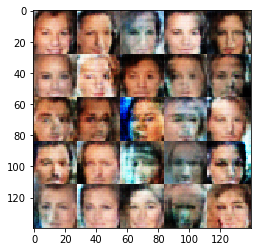

Epoch 1/10 Step 1300... Discriminator Loss: 1.1719... Generator Loss: 0.7945


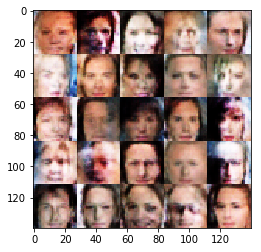

Epoch 1/10 Step 1400... Discriminator Loss: 1.2200... Generator Loss: 0.8534


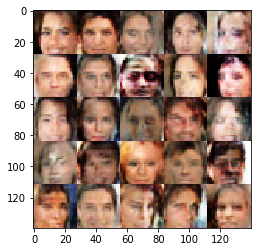

Epoch 1/10 Step 1500... Discriminator Loss: 1.1912... Generator Loss: 0.8716


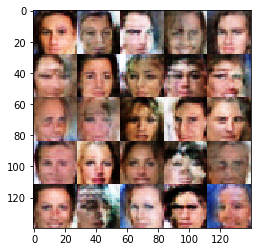

Epoch 2/10 Step 1600... Discriminator Loss: 1.2381... Generator Loss: 0.9028


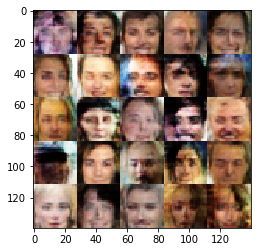

Epoch 2/10 Step 1700... Discriminator Loss: 1.2094... Generator Loss: 0.9014


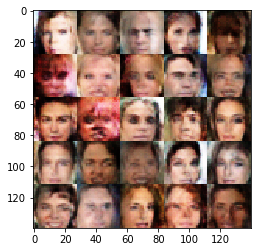

Epoch 2/10 Step 1800... Discriminator Loss: 1.1402... Generator Loss: 1.0921


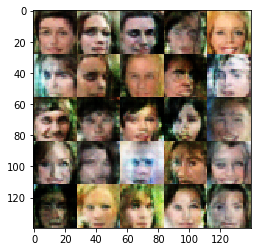

Epoch 2/10 Step 1900... Discriminator Loss: 1.0980... Generator Loss: 1.1364


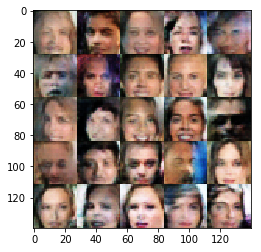

Epoch 2/10 Step 2000... Discriminator Loss: 1.1703... Generator Loss: 0.9744


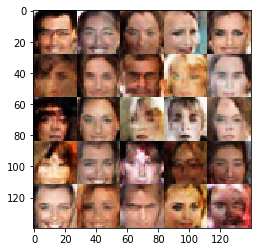

Epoch 2/10 Step 2100... Discriminator Loss: 1.1426... Generator Loss: 0.8585


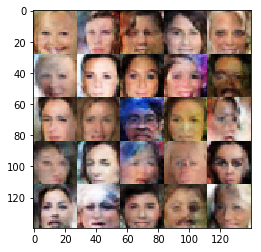

Epoch 2/10 Step 2200... Discriminator Loss: 1.3284... Generator Loss: 0.5365


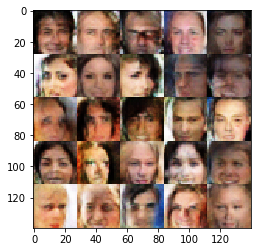

Epoch 2/10 Step 2300... Discriminator Loss: 1.2503... Generator Loss: 0.9735


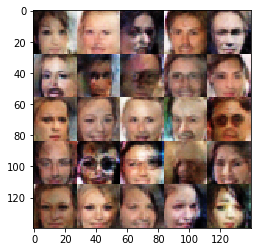

Epoch 2/10 Step 2400... Discriminator Loss: 1.2066... Generator Loss: 0.7823


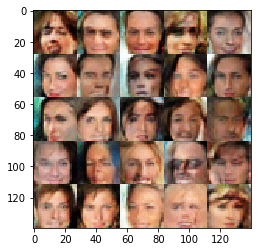

Epoch 2/10 Step 2500... Discriminator Loss: 1.2470... Generator Loss: 1.0167


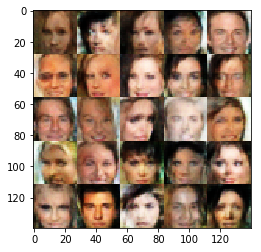

Epoch 2/10 Step 2600... Discriminator Loss: 1.2361... Generator Loss: 0.9410


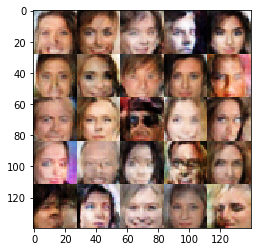

Epoch 2/10 Step 2700... Discriminator Loss: 1.1515... Generator Loss: 1.2464


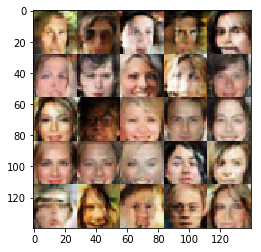

Epoch 2/10 Step 2800... Discriminator Loss: 1.4459... Generator Loss: 0.5154


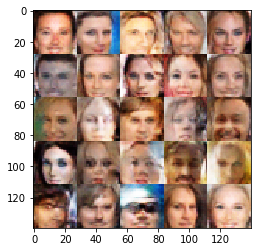

Epoch 2/10 Step 2900... Discriminator Loss: 1.4082... Generator Loss: 0.5244


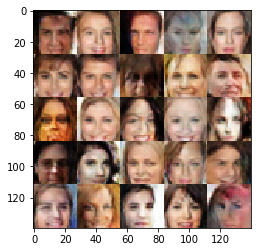

Epoch 2/10 Step 3000... Discriminator Loss: 1.3044... Generator Loss: 0.8997


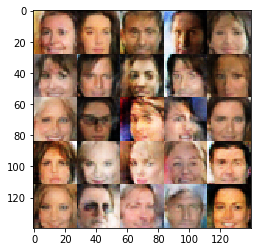

Epoch 2/10 Step 3100... Discriminator Loss: 1.1930... Generator Loss: 1.1142


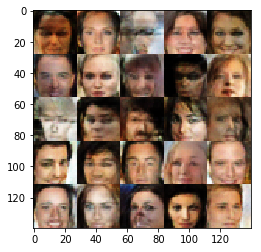

Epoch 3/10 Step 3200... Discriminator Loss: 1.2498... Generator Loss: 0.9988


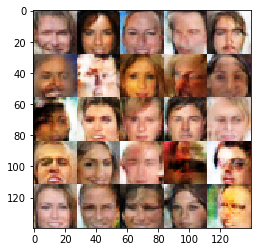

Epoch 3/10 Step 3300... Discriminator Loss: 1.5334... Generator Loss: 0.4092


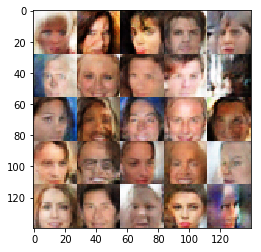

Epoch 3/10 Step 3400... Discriminator Loss: 1.1649... Generator Loss: 1.2711


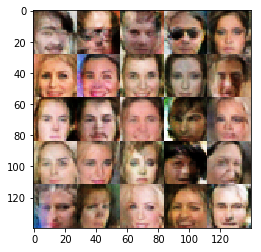

Epoch 3/10 Step 3500... Discriminator Loss: 1.2902... Generator Loss: 0.6621


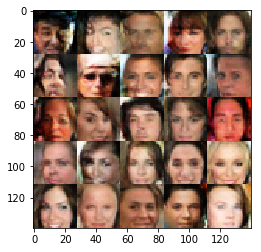

Epoch 3/10 Step 3600... Discriminator Loss: 1.2358... Generator Loss: 0.9923


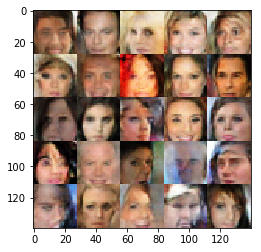

Epoch 3/10 Step 3700... Discriminator Loss: 1.2298... Generator Loss: 1.1247


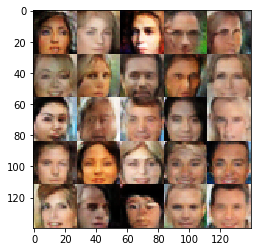

Epoch 3/10 Step 3800... Discriminator Loss: 1.4764... Generator Loss: 0.4820


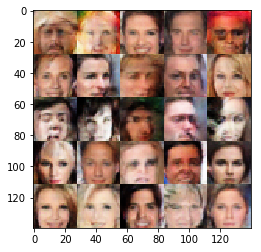

Epoch 3/10 Step 3900... Discriminator Loss: 1.5977... Generator Loss: 0.4143


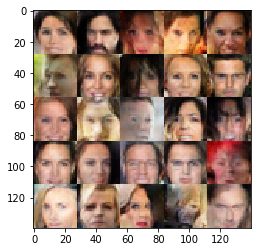

Epoch 3/10 Step 4000... Discriminator Loss: 1.5399... Generator Loss: 0.4410


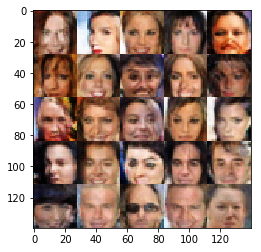

Epoch 3/10 Step 4100... Discriminator Loss: 1.3000... Generator Loss: 0.7497


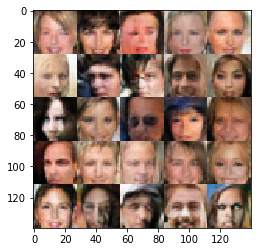

Epoch 3/10 Step 4200... Discriminator Loss: 1.4869... Generator Loss: 0.4476


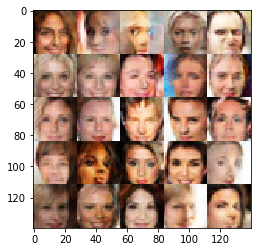

Epoch 3/10 Step 4300... Discriminator Loss: 1.3975... Generator Loss: 0.5108


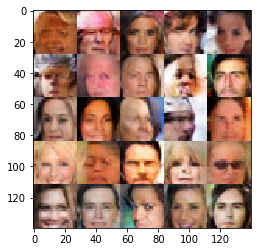

Epoch 3/10 Step 4400... Discriminator Loss: 1.2832... Generator Loss: 1.0299


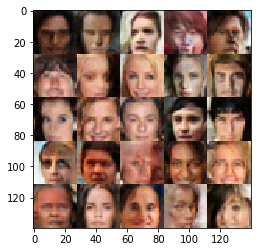

Epoch 3/10 Step 4500... Discriminator Loss: 1.8449... Generator Loss: 0.2814


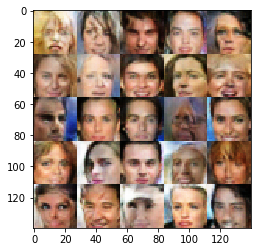

Epoch 3/10 Step 4600... Discriminator Loss: 1.2540... Generator Loss: 0.6786


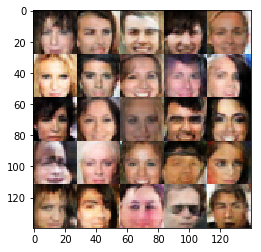

Epoch 3/10 Step 4700... Discriminator Loss: 1.3657... Generator Loss: 0.5463


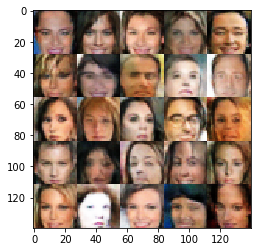

Epoch 4/10 Step 4800... Discriminator Loss: 1.2807... Generator Loss: 0.7913


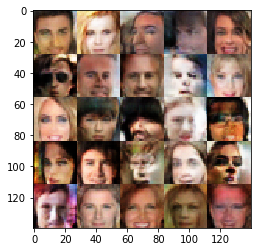

Epoch 4/10 Step 4900... Discriminator Loss: 1.5852... Generator Loss: 0.3838


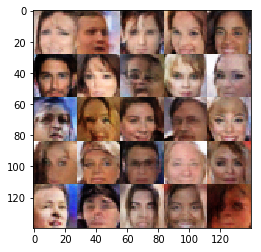

Epoch 4/10 Step 5000... Discriminator Loss: 1.1600... Generator Loss: 0.8151


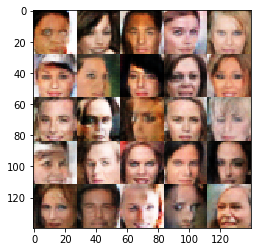

Epoch 4/10 Step 5100... Discriminator Loss: 1.2641... Generator Loss: 0.8425


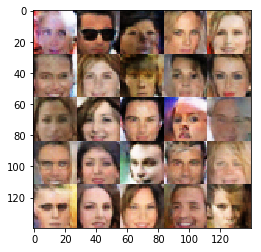

Epoch 4/10 Step 5200... Discriminator Loss: 1.1550... Generator Loss: 0.8885


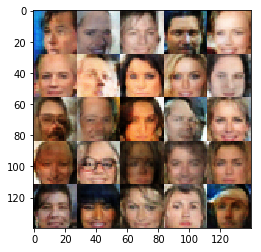

Epoch 4/10 Step 5300... Discriminator Loss: 1.6330... Generator Loss: 0.3818


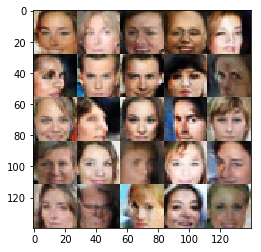

Epoch 4/10 Step 5400... Discriminator Loss: 1.7292... Generator Loss: 0.3279


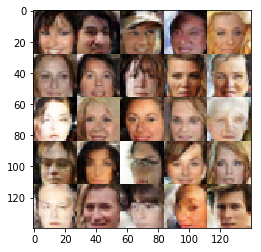

Epoch 4/10 Step 5500... Discriminator Loss: 1.3313... Generator Loss: 0.6425


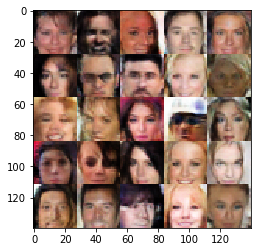

Epoch 4/10 Step 5600... Discriminator Loss: 1.2852... Generator Loss: 1.4299


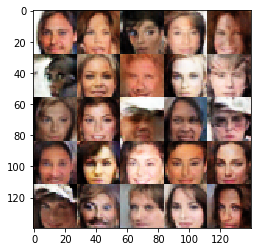

Epoch 4/10 Step 5700... Discriminator Loss: 1.2497... Generator Loss: 0.6731


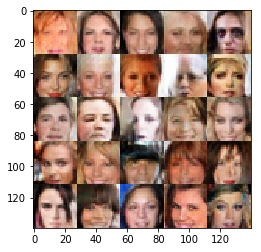

Epoch 4/10 Step 5800... Discriminator Loss: 1.2922... Generator Loss: 0.5683


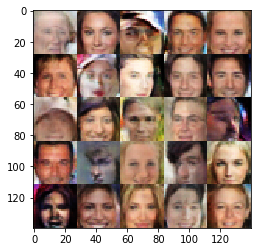

Epoch 4/10 Step 5900... Discriminator Loss: 1.6049... Generator Loss: 0.3953


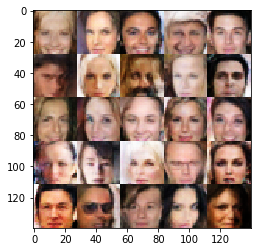

Epoch 4/10 Step 6000... Discriminator Loss: 1.1035... Generator Loss: 1.2050


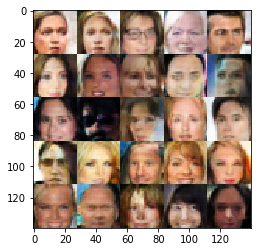

Epoch 4/10 Step 6100... Discriminator Loss: 1.1319... Generator Loss: 1.1572


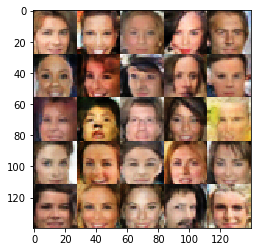

Epoch 4/10 Step 6200... Discriminator Loss: 1.2336... Generator Loss: 0.7705


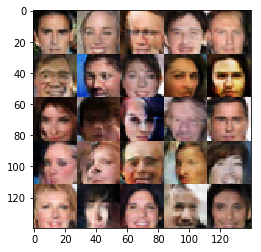

Epoch 4/10 Step 6300... Discriminator Loss: 1.1265... Generator Loss: 1.1926


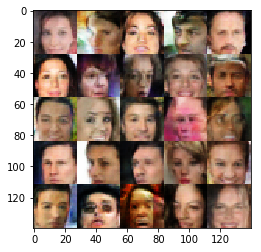

Epoch 5/10 Step 6400... Discriminator Loss: 1.7921... Generator Loss: 0.3077


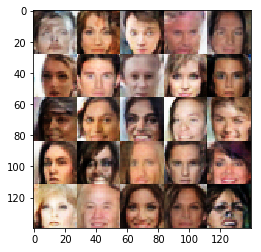

Epoch 5/10 Step 6500... Discriminator Loss: 1.8362... Generator Loss: 0.2945


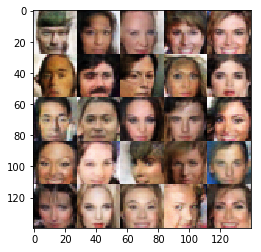

Epoch 5/10 Step 6600... Discriminator Loss: 1.4597... Generator Loss: 0.4693


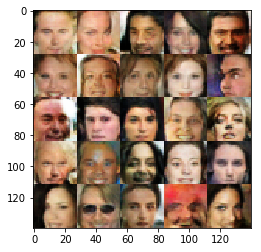

Epoch 5/10 Step 6700... Discriminator Loss: 1.7602... Generator Loss: 0.3244


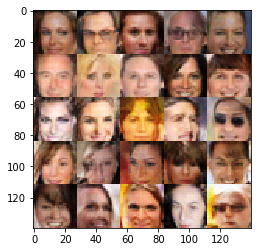

Epoch 5/10 Step 6800... Discriminator Loss: 1.3338... Generator Loss: 0.5849


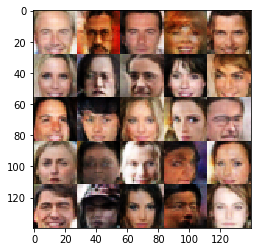

Epoch 5/10 Step 6900... Discriminator Loss: 1.7213... Generator Loss: 2.2616


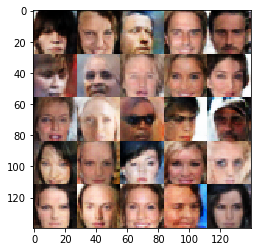

Epoch 5/10 Step 7000... Discriminator Loss: 1.2995... Generator Loss: 0.8884


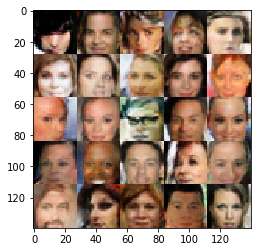

Epoch 5/10 Step 7100... Discriminator Loss: 1.0425... Generator Loss: 1.2174


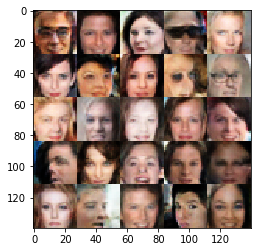

Epoch 5/10 Step 7200... Discriminator Loss: 1.0654... Generator Loss: 1.3334


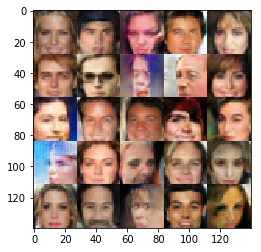

Epoch 5/10 Step 7300... Discriminator Loss: 1.7087... Generator Loss: 0.3540


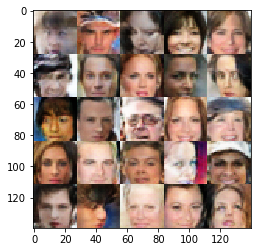

Epoch 5/10 Step 7400... Discriminator Loss: 2.0499... Generator Loss: 0.2440


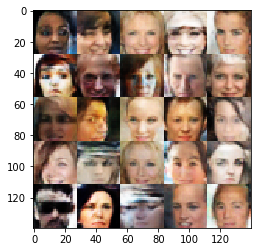

Epoch 5/10 Step 7500... Discriminator Loss: 1.1480... Generator Loss: 0.8201


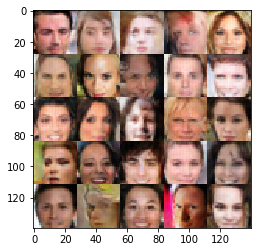

Epoch 5/10 Step 7600... Discriminator Loss: 1.4499... Generator Loss: 0.4728


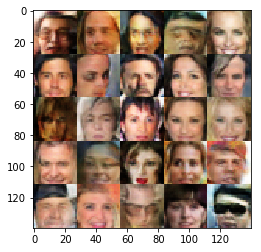

Epoch 5/10 Step 7700... Discriminator Loss: 1.0711... Generator Loss: 0.7854


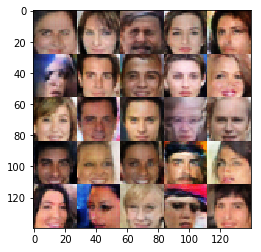

Epoch 5/10 Step 7800... Discriminator Loss: 1.0316... Generator Loss: 1.0531


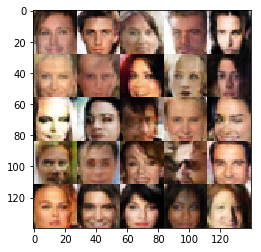

Epoch 5/10 Step 7900... Discriminator Loss: 1.5291... Generator Loss: 0.4351


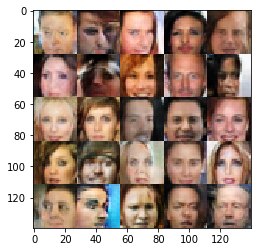

Epoch 6/10 Step 8000... Discriminator Loss: 1.1941... Generator Loss: 0.6818


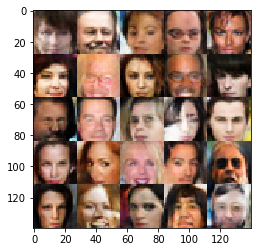

Epoch 6/10 Step 8100... Discriminator Loss: 1.4873... Generator Loss: 0.4598


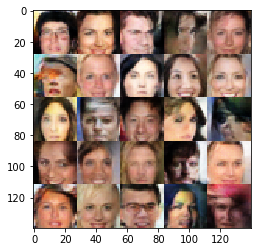

Epoch 6/10 Step 8200... Discriminator Loss: 1.8220... Generator Loss: 0.3093


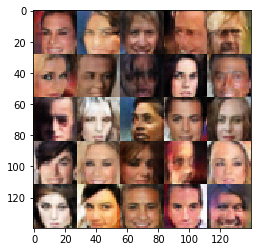

Epoch 6/10 Step 8300... Discriminator Loss: 1.7287... Generator Loss: 0.3498


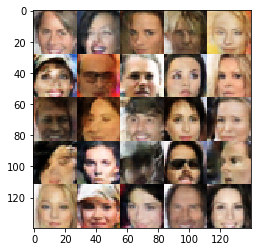

Epoch 6/10 Step 8400... Discriminator Loss: 1.2095... Generator Loss: 0.9508


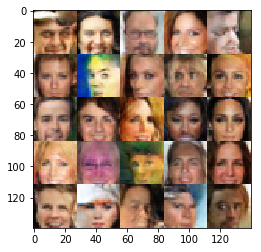

Epoch 6/10 Step 8500... Discriminator Loss: 1.4123... Generator Loss: 0.5309


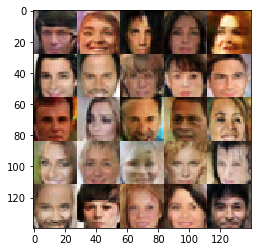

Epoch 6/10 Step 8600... Discriminator Loss: 1.1494... Generator Loss: 0.8778


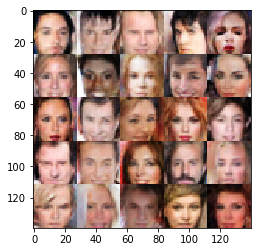

Epoch 6/10 Step 8700... Discriminator Loss: 0.9670... Generator Loss: 1.1090


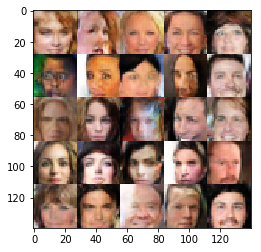

Epoch 6/10 Step 8800... Discriminator Loss: 1.0852... Generator Loss: 0.8355


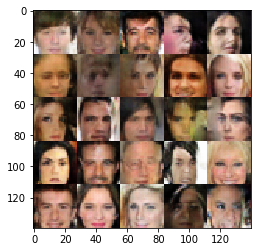

Epoch 6/10 Step 8900... Discriminator Loss: 0.8584... Generator Loss: 1.1190


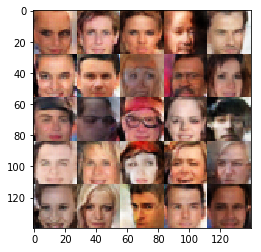

Epoch 6/10 Step 9000... Discriminator Loss: 0.9056... Generator Loss: 1.0970


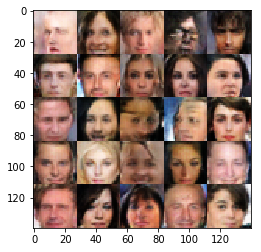

Epoch 6/10 Step 9100... Discriminator Loss: 1.4553... Generator Loss: 0.4912


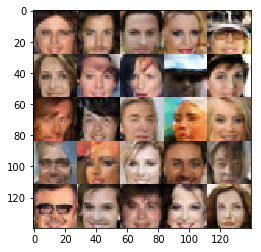

Epoch 6/10 Step 9200... Discriminator Loss: 2.0845... Generator Loss: 0.2458


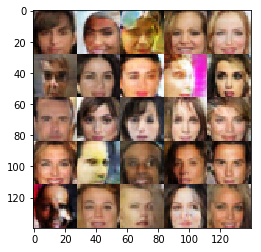

Epoch 6/10 Step 9300... Discriminator Loss: 1.7310... Generator Loss: 0.3596


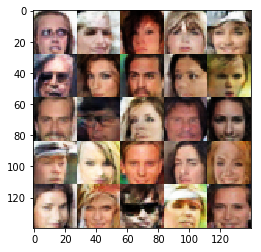

Epoch 6/10 Step 9400... Discriminator Loss: 0.9810... Generator Loss: 0.9178


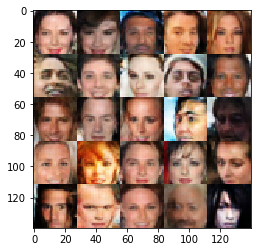

Epoch 7/10 Step 9500... Discriminator Loss: 1.5338... Generator Loss: 0.4641


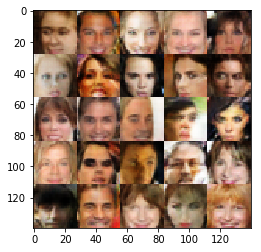

Epoch 7/10 Step 9600... Discriminator Loss: 0.8389... Generator Loss: 1.3317


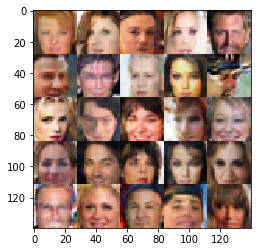

Epoch 7/10 Step 9700... Discriminator Loss: 1.2499... Generator Loss: 0.6180


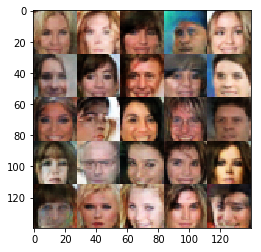

Epoch 7/10 Step 9800... Discriminator Loss: 1.3425... Generator Loss: 0.5567


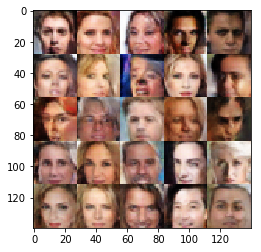

Epoch 7/10 Step 9900... Discriminator Loss: 0.8996... Generator Loss: 1.0280


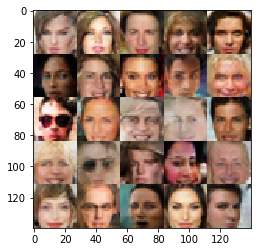

Epoch 7/10 Step 10000... Discriminator Loss: 1.7607... Generator Loss: 0.3623


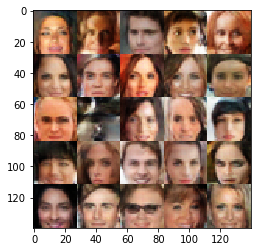

Epoch 7/10 Step 10100... Discriminator Loss: 2.3369... Generator Loss: 0.2147


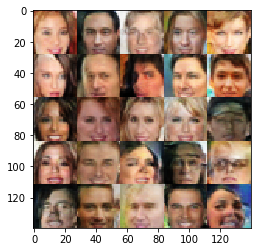

Epoch 7/10 Step 10200... Discriminator Loss: 1.0011... Generator Loss: 0.8902


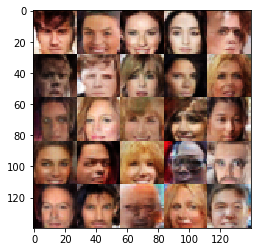

Epoch 7/10 Step 10300... Discriminator Loss: 1.3582... Generator Loss: 0.5674


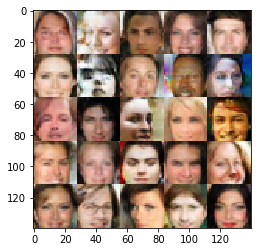

Epoch 7/10 Step 10400... Discriminator Loss: 1.0156... Generator Loss: 1.0201


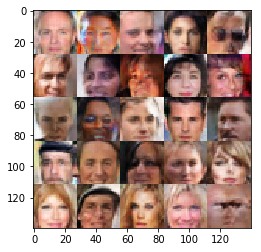

Epoch 7/10 Step 10500... Discriminator Loss: 1.9582... Generator Loss: 0.2819


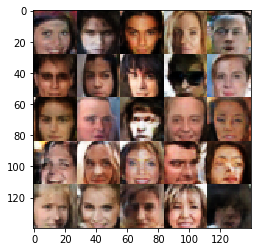

Epoch 7/10 Step 10600... Discriminator Loss: 1.1137... Generator Loss: 0.9537


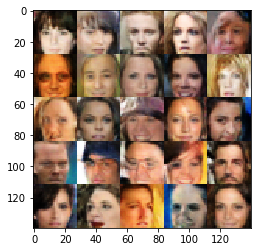

Epoch 7/10 Step 10700... Discriminator Loss: 1.7210... Generator Loss: 0.3812


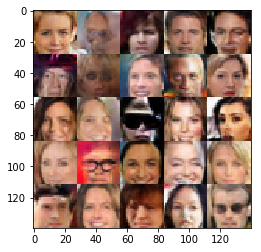

Epoch 7/10 Step 10800... Discriminator Loss: 1.3168... Generator Loss: 0.5938


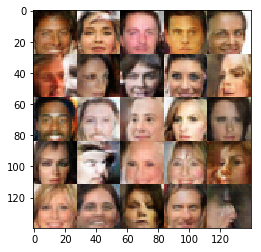

Epoch 7/10 Step 10900... Discriminator Loss: 1.1488... Generator Loss: 0.7867


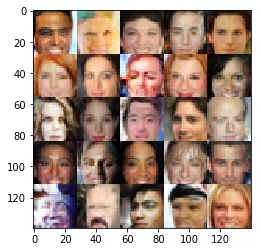

Epoch 7/10 Step 11000... Discriminator Loss: 1.0389... Generator Loss: 1.7827


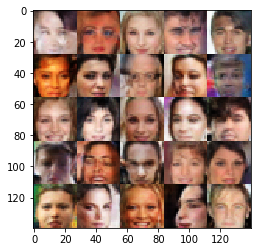

Epoch 8/10 Step 11100... Discriminator Loss: 0.8352... Generator Loss: 1.2315


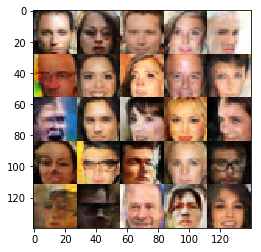

Epoch 8/10 Step 11200... Discriminator Loss: 0.9556... Generator Loss: 1.1357


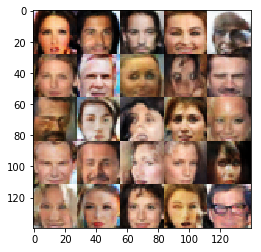

Epoch 8/10 Step 11300... Discriminator Loss: 1.1358... Generator Loss: 1.1153


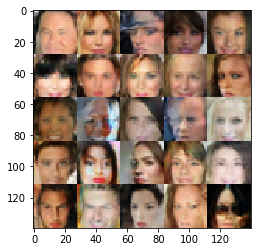

Epoch 8/10 Step 11400... Discriminator Loss: 1.1694... Generator Loss: 0.7180


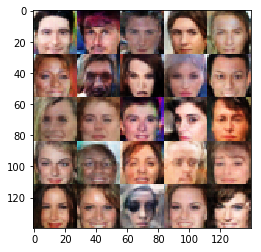

Epoch 8/10 Step 11500... Discriminator Loss: 1.2116... Generator Loss: 0.6816


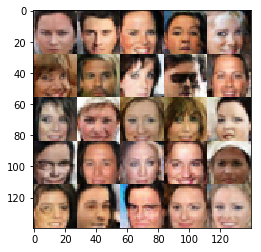

Epoch 8/10 Step 11600... Discriminator Loss: 0.9278... Generator Loss: 1.1244


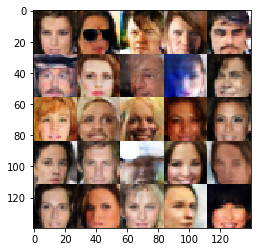

Epoch 8/10 Step 11700... Discriminator Loss: 0.7125... Generator Loss: 1.7719


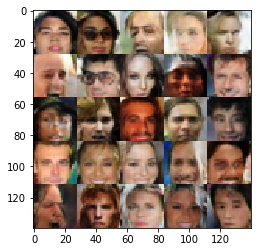

Epoch 8/10 Step 11800... Discriminator Loss: 1.4723... Generator Loss: 0.5237


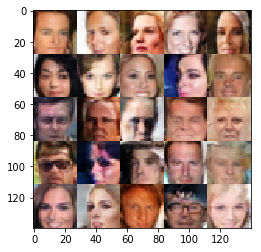

Epoch 8/10 Step 11900... Discriminator Loss: 0.9475... Generator Loss: 1.3948


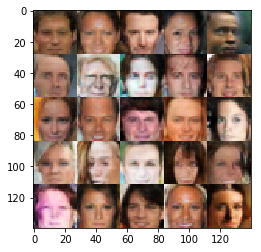

Epoch 8/10 Step 12000... Discriminator Loss: 0.7869... Generator Loss: 2.0069


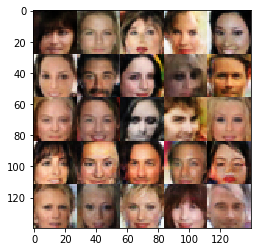

Epoch 8/10 Step 12100... Discriminator Loss: 1.2232... Generator Loss: 0.7024


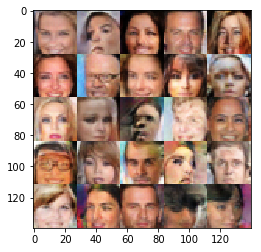

Epoch 8/10 Step 12200... Discriminator Loss: 1.3976... Generator Loss: 2.6683


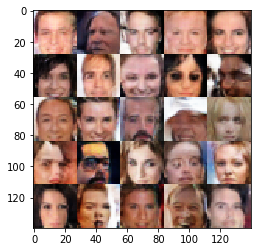

Epoch 8/10 Step 12300... Discriminator Loss: 0.7164... Generator Loss: 1.4812


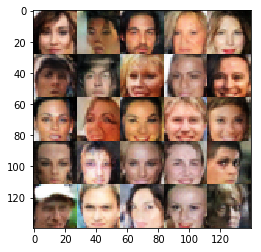

Epoch 8/10 Step 12400... Discriminator Loss: 1.7251... Generator Loss: 0.3907


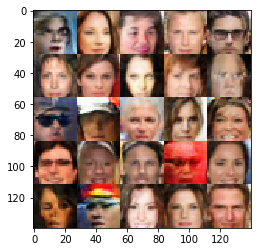

Epoch 8/10 Step 12500... Discriminator Loss: 0.8926... Generator Loss: 1.3255


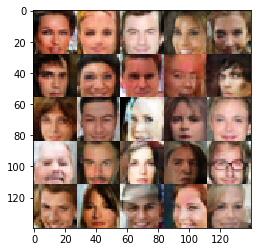

Epoch 8/10 Step 12600... Discriminator Loss: 1.0285... Generator Loss: 0.9513


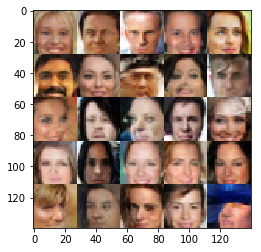

Epoch 9/10 Step 12700... Discriminator Loss: 1.0513... Generator Loss: 1.0386


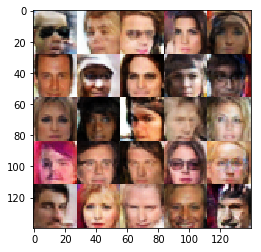

Epoch 9/10 Step 12800... Discriminator Loss: 0.5596... Generator Loss: 2.0561


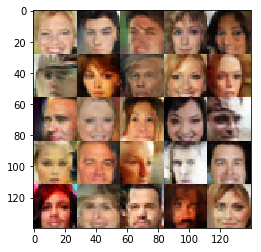

Epoch 9/10 Step 12900... Discriminator Loss: 0.8002... Generator Loss: 1.6556


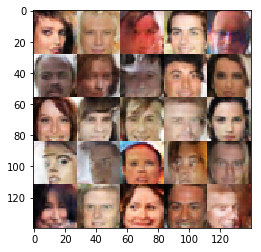

Epoch 9/10 Step 13000... Discriminator Loss: 1.3587... Generator Loss: 0.5773


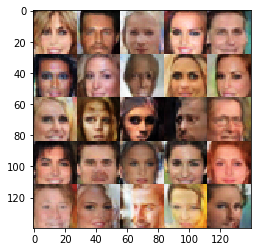

Epoch 9/10 Step 13100... Discriminator Loss: 0.9803... Generator Loss: 0.9850


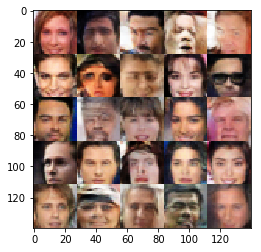

Epoch 9/10 Step 13200... Discriminator Loss: 1.5915... Generator Loss: 0.4437


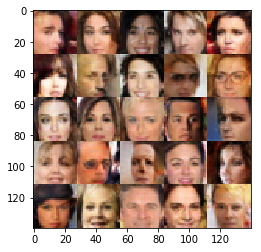

Epoch 9/10 Step 13300... Discriminator Loss: 0.8951... Generator Loss: 1.1649


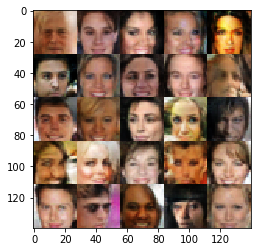

Epoch 9/10 Step 13400... Discriminator Loss: 2.3442... Generator Loss: 0.2165


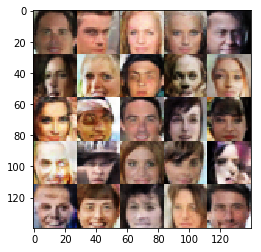

Epoch 9/10 Step 13500... Discriminator Loss: 1.3775... Generator Loss: 0.6518


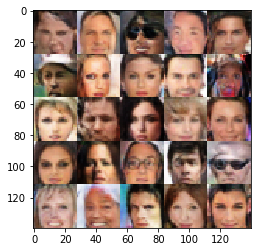

Epoch 9/10 Step 13600... Discriminator Loss: 1.1952... Generator Loss: 0.7168


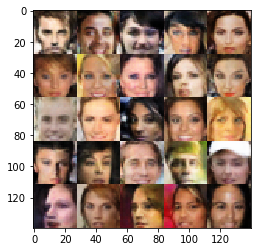

Epoch 9/10 Step 13700... Discriminator Loss: 0.9348... Generator Loss: 1.1512


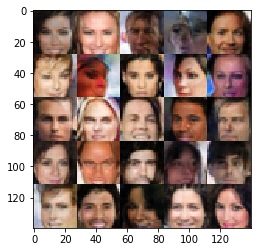

Epoch 9/10 Step 13800... Discriminator Loss: 0.8110... Generator Loss: 1.2403


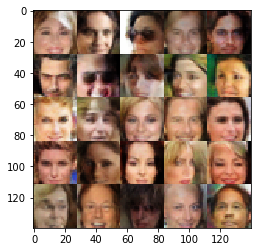

Epoch 9/10 Step 13900... Discriminator Loss: 0.8653... Generator Loss: 1.1677


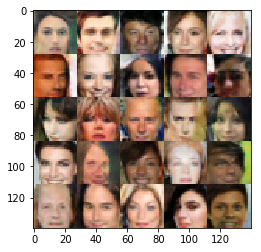

Epoch 9/10 Step 14000... Discriminator Loss: 0.8276... Generator Loss: 1.1899


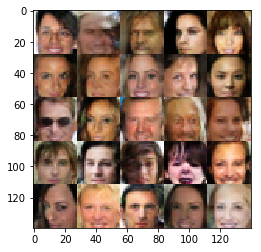

Epoch 9/10 Step 14100... Discriminator Loss: 0.8457... Generator Loss: 1.1293


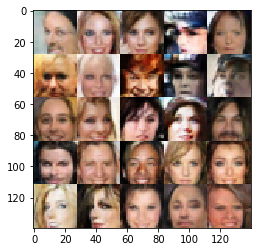

Epoch 9/10 Step 14200... Discriminator Loss: 1.5434... Generator Loss: 0.5082


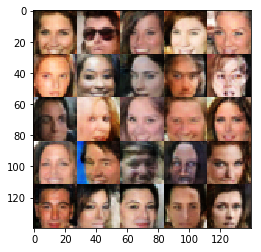

Epoch 10/10 Step 14300... Discriminator Loss: 1.6182... Generator Loss: 0.4895


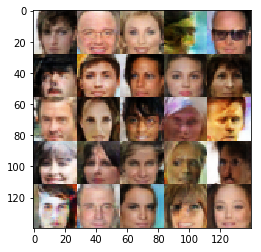

Epoch 10/10 Step 14400... Discriminator Loss: 1.2749... Generator Loss: 0.6362


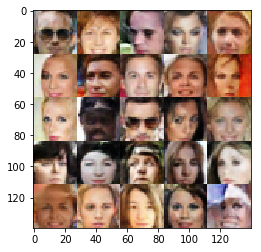

Epoch 10/10 Step 14500... Discriminator Loss: 1.2197... Generator Loss: 1.6331


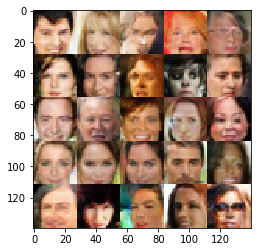

Epoch 10/10 Step 14600... Discriminator Loss: 1.3187... Generator Loss: 0.5847


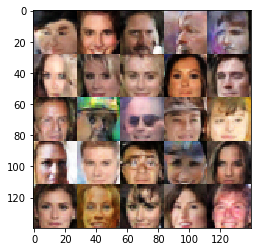

Epoch 10/10 Step 14700... Discriminator Loss: 1.0207... Generator Loss: 0.9592


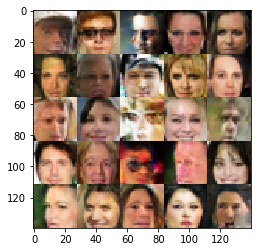

Epoch 10/10 Step 14800... Discriminator Loss: 0.9283... Generator Loss: 0.9753


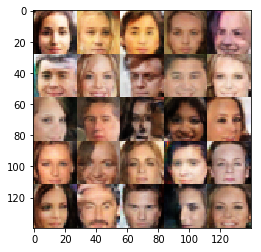

Epoch 10/10 Step 14900... Discriminator Loss: 1.0132... Generator Loss: 0.9786


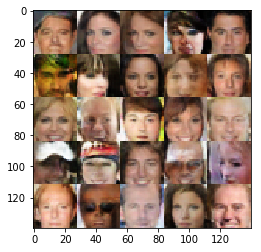

Epoch 10/10 Step 15000... Discriminator Loss: 0.6842... Generator Loss: 1.6622


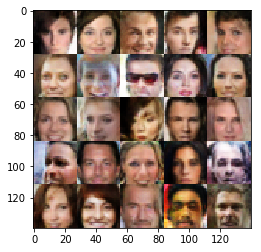

Epoch 10/10 Step 15100... Discriminator Loss: 0.8724... Generator Loss: 1.2358


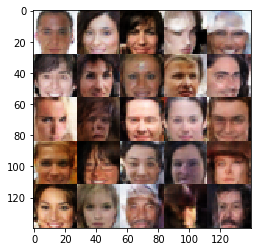

Epoch 10/10 Step 15200... Discriminator Loss: 1.1388... Generator Loss: 0.8238


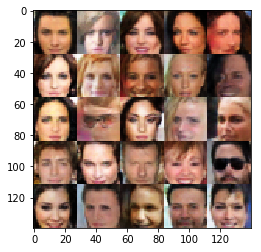

Epoch 10/10 Step 15300... Discriminator Loss: 0.9561... Generator Loss: 1.0399


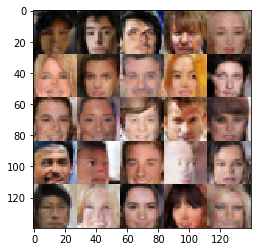

Epoch 10/10 Step 15400... Discriminator Loss: 1.8160... Generator Loss: 0.3749


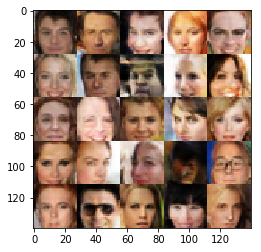

Epoch 10/10 Step 15500... Discriminator Loss: 0.6032... Generator Loss: 1.7923


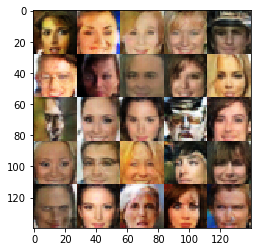

Epoch 10/10 Step 15600... Discriminator Loss: 1.2287... Generator Loss: 0.7800


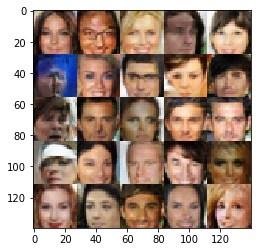

Epoch 10/10 Step 15700... Discriminator Loss: 1.4077... Generator Loss: 3.3825


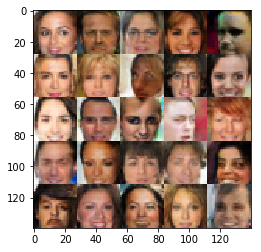

Epoch 10/10 Step 15800... Discriminator Loss: 0.6619... Generator Loss: 1.9467


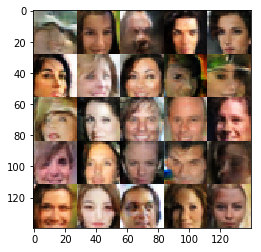

In [75]:
batch_size = 128
z_dim = 128
learning_rate = 0.001
beta1 = 0.2
losses = []


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

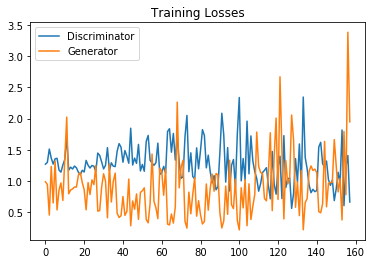

In [76]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.